In [1]:
"""PARAMETERS TO CAPTURE ON STDIN VIA PAPERMILL...."""
#config_path = 'configs/species_experiments/Escherichia_coli_lysate.yaml'
config_path = 'configs/global_loss_MSE/global_allmeltome.yaml'


In [2]:
# Parameters
config_path = "configs/global_loss_MSE/global_allmeltome.yaml"


In [3]:
import yaml

print(f"the value of path captured is: {config_path}")

with open(config_path, 'r') as file:
    config = yaml.safe_load(file)
    
#print(config)
#print(f"the value of path captured is: {config_path}")

the value of path captured is: configs/global_loss_MSE/global_allmeltome.yaml


In [4]:
#import ipdb; ipdb.set_trace()

path_progresESM    = config['initial_paths']['path_progresESM']
checkpoint_pathESM = config['initial_paths']['checkpoint_pathESM']

path_progresPiFold    = config['initial_paths']['path_progresPiFold']
checkpoint_pathPiFold = config['initial_paths']['checkpoint_pathPiFold']


path_progresMix= config['initial_paths']['path_progresMix']
#checkpoint_pathMix='../checkpoints/LA_MLP_TaskVectorBias_Merged_allnet_1_10_2023_finetunning_NoMLPincNoBN_lrx00001_lossmod/'
checkpoint_pathMix= config['initial_paths']['checkpoint_pathMix']


organism = config['organism']['organism']
keyword = config['organism']['keyword']

#ESM_source = 'esm2_embeddings'
ESM_source = config['initial_paths']['ESM_source']
PiFold_source = config['initial_paths']['PiFold_source']

prepro_train_emb_ESM = config['initial_paths']['prepro_train_emb_ESM']
prepro_test_emb_ESM  = config['initial_paths']['prepro_test_emb_ESM']
prepro_val_emb_ESM   = config['initial_paths']['prepro_val_emb_ESM']

prepro_train_emb_PiFold = config['initial_paths']['prepro_train_emb_PiFold']
prepro_test_emb_PiFold  = config['initial_paths']['prepro_test_emb_PiFold']
prepro_val_emb_PiFold   = config['initial_paths']['prepro_val_emb_PiFold']

In [5]:
import __init__

from src.utilities import train_test_validation_splits, \
                            prepare_train_test_val_seqs_by_batches, \
                            tensor2dataloader, load_full_meltome_FLIP_db, \
                            seek_UniprotID_association_Meltome_prots,\
                            download_UniprotID_Alphafold_Structures,\
                            get_guided_encoder_output,\
                            ESM2_IF_repr
                            
import pandas as pd
import numpy as np
    
import ipdb
path_meltome = config['meltome']['path_meltome']
complete_meltome_db = config['meltome']['complete_meltome_db']

full_meltome_db = load_full_meltome_FLIP_db(complete_meltome_db)

splits_meltome = pd.read_csv(path_meltome, sep=',')

#import ipdb; ipdb.set_trace()

splits_meltome = seek_UniprotID_association_Meltome_prots(splits_meltome, full_meltome_db)
split_meltome = splits_meltome[splits_meltome['sequence'].str.len()>= 50]
#import ipdb; ipdb.set_trace()
'''------------------------------------------------------------------------------------------------------------------------------'''
'''------------------------------------------------------------------------------------------------------------------------------'''
'''                      JUST FILTERING TO TAKE BACTERIA AND IGNORE EUKARIOTIC SAMPLES (HUMAN, PLANTS, CANCER CELLS, ETC)        '''

list_bacteria = [ "Caenorhabditis_elegans_lysate", "Saccharomyces_cerevisiae_lysate", "Escherichia_coli_lysate", 
                 "Escherichia_coli_cells", "Bacillus_subtilis_168_lysate_R1", "Oleispira_antarctica_RB-8_lysate_R1", 
                 "Picrophilus_torridus_DSM9790_lysate", "Thermus_thermophilus_HB27_cells", 
                 "Geobacillus_stearothermophilus_NCA26_lysate", "Thermus_thermophilus_HB27_lysate"]
#splits_meltome = splits_meltome[ splits_meltome.organism.isin( list_bacteria ) ]

'''------------------------------------------------------------------------------------------------------------------------------'''
'''------------------------------------------------------------------------------------------------------------------------------'''

train, val, test = train_test_validation_splits(splits_meltome)


print("Done")



Done


In [6]:
import torch
import src.IF_PiFold_embeddings  as PiFoldconf 
#from src.IF_PiFold_embeddings import PiFold_setup


args = PiFoldconf.get_parser()
exp = PiFoldconf.PiFold_setup(args)
svpath = config['Pifold_pretrain']['svpath']
exp.method.load_state_dict(torch.load(svpath+'checkpoint.pth'))


Use GPU: cuda:0



device: 	cuda	
display_step: 	10	
res_dir: 	results	
ex_name: 	ProDesign	
use_gpu: 	True	
gpu: 	0	
seed: 	111	
data_name: 	CATH	
data_root: 	data/	
batch_size: 	8	
num_workers: 	8	
method: 	ProDesign	
config_file: 	None	
hidden_dim: 	128	
node_features: 	128	
edge_features: 	128	
k_neighbors: 	30	
dropout: 	0.1	
num_encoder_layers: 	10	
epoch: 	100	
log_step: 	1	
lr: 	0.001	
patience: 	100	
updating_edges: 	4	
node_dist: 	1	
node_angle: 	1	
node_direct: 	1	
edge_dist: 	1	
edge_angle: 	1	
edge_direct: 	1	
virtual_num: 	3	


<All keys matched successfully>

In [7]:
from tqdm.auto import tqdm
import torch
from src.ESM2embeddings import ESM2embeddings
from src.ESM2_IF1_embeddings import ESM2_IF1_embeddings
from src.utilities import train_test_validation_splits, prepare_train_test_val_seqs_by_batches, tensor2dataloader,read_and_plot_loss_curves, cleanup_by_organism_and_correspondence_idx
from src.NeuralArchitectures import regressionHead

from src.AdaptiveDataset import AdaptiveDataset

structuredir =  config['structures_path']['structuredir']
meltome_struct_dir_labels =  config['structures_path']['meltome_struct_dir_labels']

#import ipdb; ipdb.set_trace()
import os 
if not os.listdir(structuredir) and not os.path.isfile(meltome_struct_dir_labels+'Meltome_Splits_FLIPS_train.txt')\
                                and not os.path.isfile(meltome_struct_dir_labels+'Meltome_Splits_FLIPS_test.txt')\
                                and not os.path.isfile(meltome_struct_dir_labels+'Meltome_Splits_FLIPS_val.txt'): 
    
    print("Finding structures to proteins via Alphafold/PDB dbs..........") 
    
    download_UniprotID_Alphafold_Structures(train, structuredir, meltome_struct_dir_labels, 'Meltome_Splits_FLIPS_train')
    download_UniprotID_Alphafold_Structures(test, structuredir, meltome_struct_dir_labels, 'Meltome_Splits_FLIPS_test')
    download_UniprotID_Alphafold_Structures(val, structuredir, meltome_struct_dir_labels, 'Meltome_Splits_FLIPS_val')


#import ipdb; ipdb.set_trace()
Structinfo_Meltome_Splits_train = pd.read_csv( meltome_struct_dir_labels+'Meltome_Splits_FLIPS_train.txt', sep='\t').set_index(train.index)
Structinfo_Meltome_Splits_test = pd.read_csv( meltome_struct_dir_labels+'Meltome_Splits_FLIPS_test.txt', sep='\t').set_index(test.index)
Structinfo_Meltome_Splits_val = pd.read_csv( meltome_struct_dir_labels+'Meltome_Splits_FLIPS_val.txt', sep='\t').set_index(val.index)


#import ipdb; ipdb.set_trace()

train = pd.concat([train, Structinfo_Meltome_Splits_train], axis=1).query('Source=="alphafold"')
test = pd.concat([test, Structinfo_Meltome_Splits_test], axis=1).query('Source=="alphafold"')
val = pd.concat([val, Structinfo_Meltome_Splits_val], axis=1).query('Source=="alphafold"')



if config['organism']['Global']==True:
    idxdf_idxfile_train, _ = cleanup_by_organism_and_correspondence_idx(train, organism, keyword)
    idxdf_idxfile_test, _ = cleanup_by_organism_and_correspondence_idx(test, organism, keyword)
    idxdf_idxfile_val, _ = cleanup_by_organism_and_correspondence_idx(val, organism, keyword)
    
    if 'umap_clusters_clean_meltome_train' in config['meltome']:
        clusters=pd.read_csv(config['meltome']['umap_clusters_clean_meltome_train'], sep='\t').cluster.tolist()
        train['umap_clusters'] = clusters
        train =  train[train.umap_clusters !=-1]
    
else:
    idxdf_idxfile_train, train = cleanup_by_organism_and_correspondence_idx(train, organism, keyword)
    idxdf_idxfile_test, test = cleanup_by_organism_and_correspondence_idx(test, organism, keyword)
    idxdf_idxfile_val, val = cleanup_by_organism_and_correspondence_idx(val, organism, keyword)
    



'''------------------------------------------------------------------------------------------------------------------------------'''
'''------------------------------------------------------------------------------------------------------------------------------'''
'''                      JUST FILTERING TO TAKE BACTERIA AND IGNORE EUKARIOTIC SAMPLES (HUMAN, PLANTS, CANCER CELLS, ETC)        '''

#train = train[ train.organism.isin( list_bacteria ) ]
#test = test[ test.organism.isin( list_bacteria ) ]
#val = val[ val.organism.isin( list_bacteria ) ]

'''------------------------------------------------------------------------------------------------------------------------------'''
'''------------------------------------------------------------------------------------------------------------------------------'''

'------------------------------------------------------------------------------------------------------------------------------'

In [8]:
train.shape
print(train)
print(train.columns)
#train.to_csv('../datasets/train_MeltomeMix_for_cleaning.csv', sep="\t", index=False)
#import ipdb; ipdb.set_trace()
"""
# temp fasta file convertion to cleaning
with open('../datasets/train_MeltomeMix_for_cleaning.csv.fasta', 'w') as f:
    for k, v in zip(train.index.tolist(),train.sequence):
        f.write(f'>{k}\n{v}\n')
"""

                                                sequence            target  \
0      MSGEEEKAADFYVRYYVGHKGKFGHEFLEFEFRPNGSLRYANNSNY...  37.9629473421417   
1      MSMGSDFYLRYYVGHKGKFGHEFLEFEFRPDGKLRYANNSNYKNDV...  54.4253424806097   
2      MRICFLLLAFLVAETFANELTRCCAGGTRHFKNSNTCSSIKSEGTS...  49.4592155176475   
3      MIRVALPTTASAIPRSISTSPGETISKNHEEEVKRVWRKADAVCFD...  42.5931308043435   
4      MNGDWSRAFVLSKVKNLYFFVIIDKGFSAILNDPREPVQVGGFFEV...  37.9994780790578   
...                                                  ...               ...   
27944  MAVVLPAVVEELLSEMAAAVQESARIPDEYLLSLKFLFGSSATQAL...  56.8600005753223   
27945  MLSCNICGETVTSEPDMKAHLIVHMESEIICPFCKLSGVNYDEMCF...  45.1243026020368   
27946  MDLPALLPAPTARGGQHGGGPGPLRRAPAPLGASPARRRLLLVRGP...   47.008000426981   
27947  MPEDQAGAAMEEASPYSLLDICLNFLTTHLEKFCSARQDGTLCLQE...  51.8978809719254   
27948  MAAPRPSPAISVSVSAPAFYAPQKKFGPVVAPKPKVNPFRPGDSEP...  63.5734388197048   

         set  validation  protein_id  \
0      train       Fals

"\n# temp fasta file convertion to cleaning\nwith open('../datasets/train_MeltomeMix_for_cleaning.csv.fasta', 'w') as f:\n    for k, v in zip(train.index.tolist(),train.sequence):\n        f.write(f'>{k}\n{v}\n')\n"

In [9]:

import torch, os, gc
import torch_geometric
import torch_sparse
from torch_geometric.nn import MessagePassing
import warnings
warnings.filterwarnings('ignore')



pt_batch_size = 16
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

ESM2 = ESM2embeddings(type_embedding = "facebook/esm2_t33_650M_UR50D", device = device, type_tool='FacebookESM2')

dir_pre_generated_embeddings =  config['ESM2embeddings']['dir_pre_generated_embeddings'] 
dir_IFPiFold_Meltome_train = dir_pre_generated_embeddings + PiFold_source + '/Meltome_train/'
dir_IFPiFold_Meltome_test = dir_pre_generated_embeddings +  PiFold_source + '/Meltome_test/'
dir_IFPiFold_Meltome_val = dir_pre_generated_embeddings +  PiFold_source + '/Meltome_val/'


path_train= dir_pre_generated_embeddings+prepro_train_emb_ESM
path_test= dir_pre_generated_embeddings+prepro_test_emb_ESM
path_val= dir_pre_generated_embeddings+prepro_val_emb_ESM

"""
path_esm2_train= dir_pre_generated_embeddings+'esm2_embeddings/train/'
path_esm2_test= dir_pre_generated_embeddings+'esm2_embeddings/test/'
path_esm2_val= dir_pre_generated_embeddings+'esm2_embeddings/val/'
"""

path_esm2_train= dir_pre_generated_embeddings+ESM_source+'/Meltome/train/'
path_esm2_test= dir_pre_generated_embeddings+ESM_source+'/Meltome/test/'
path_esm2_val= dir_pre_generated_embeddings+ESM_source+'/Meltome/val/'




def padding_tensor( a, size_end ,val_pad=0):
    a_size = a.shape
    f_size = torch.zeros(size_end[0], size_end[1])
    
    if size_end[0]>=a_size[0]:
        f_size[0:a_size[0]] = a
    else:
        f_size = a[0:size_end[0]]
    return f_size

def ensemble_dataset_from_IF_embeddings(folder_path, max_size=600, dim_IF=128):
    import os
    
    paths = os.listdir(folder_path)
    list_max=[]
    tensor_container = torch.zeros(len(paths),max_size,dim_IF)
    print('Starting load of Inverse Folding Embeddings:  \n')
    
    for i in tqdm(range(0,len(paths))):
        tmp_tensor = torch.load(folder_path+paths[i])
        list_max.append(tmp_tensor.shape[0])
        tmp_tensor = padding_tensor(tmp_tensor, [max_size,dim_IF])
        tensor_container[i]=tmp_tensor
        
    print('maximum structure length in meltome: ' + str(max(list_max)))
    return tensor_container
              

def embedding_builder_ESM2(ESM2, device, train, test, val, path_train, path_test, path_val):
    if os.path.isfile(path_train)==False and os.path.isfile(path_test)==False and os.path.isfile(path_val)==False:
        print ("Creating Embeddings...")   
        train_embeddings = ESM2.esm2embedding(train, device, layer_index=33,folder_path=path_esm2_train) #esm2embedding(train, model, batch_converter, device, layer_index=33)#BERT.embed_dataset(batch_train)
        torch.save(train_embeddings, path_train)
        test_embeddings = ESM2.esm2embedding(test, device, layer_index=33,folder_path=path_esm2_test) #esm2embedding(test, model, batch_converter, device, layer_index=33)
        torch.save(test_embeddings, path_test)
        val_embeddings = ESM2.esm2embedding(val, device, layer_index=33,folder_path=path_esm2_val) #esm2embedding(val, model, batch_converter, device, layer_index=33)
        torch.save(val_embeddings, path_val)
        print ("Loaded")
    else:
        print ("Loading Premade Embeddings...")
        train_embeddings = torch.load(path_train)
        test_embeddings = torch.load(path_test)
        val_embeddings = torch.load(path_val)
        print ("Loaded")
    return train_embeddings, test_embeddings, val_embeddings

#def IFBuilder_sets(model, alphabet, train, test, val, path_IFtrain, path_IFtest, path_IFval):
def IFBuilder_sets(IF, train, test, val, path_IFtrain, path_IFtest, path_IFval):

    if len(os.listdir(path_IFtrain))==0 and len(os.listdir(path_IFtest))==0 and len(os.listdir(path_IFval))==0: #os.path.isfile(path_IFtrain)==False and os.path.isfile(path_IFtest)==False and os.path.isfile(path_IFval)==False:

        #IF_embeddings_train = ESM2_IF_repr(train, model, alphabet, folder_path='../prepro_embeddings/esm2_if1_embeddings/Meltome_train')
        IF_embeddings_train = IF.IF_repr(train, folder_path='../prepro_embeddings/PiFold_if1_embeddings/Meltome_train')
        torch.save(IF_embeddings_train, path_IFtrain)

        #IF_embeddings_test = ESM2_IF_repr(test, model, alphabet, folder_path='../prepro_embeddings/esm2_if1_embeddings/Meltome_test')
        IF_embeddings_test = IF.IF_repr(test, folder_path='../prepro_embeddings/PiFold_if1_embeddings/Meltome_test')
        torch.save(IF_embeddings_test, path_IFtest)

        #IF_embeddings_val = ESM2_IF_repr(val, model, alphabet, folder_path='../prepro_embeddings/esm2_if1_embeddings/Meltome_val')
        IF_embeddings_val = IF.IF_repr(val, folder_path='../prepro_embeddings/PiFold_if1_embeddings/Meltome_val')
        torch.save(IF_embeddings_val, path_IFval)
    else:
        print ("Loading Premade Embeddings...")
        # 2700 is the maximum size of protein structure extracted from Alphafold DB to Meltome Atlas 
        #ipdb.set_trace()
        IF_embeddings_train = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_train,max_size=2700)
        IF_embeddings_test = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_test, max_size=2700)
        IF_embeddings_val = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_val, max_size=2700)
        print ("Loaded")
    return IF_embeddings_train, IF_embeddings_test, IF_embeddings_val

# 2700 is the maximum size of protein structure extracted from Alphafold DB to Meltome Atlas 
'''
IF_embeddings_train = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_train,max_size=2700)
IF_embeddings_test = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_test, max_size=2700)
IF_embeddings_val = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_val, max_size=2700)
'''


'\nIF_embeddings_train = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_train,max_size=2700)\nIF_embeddings_test = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_test, max_size=2700)\nIF_embeddings_val = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_val, max_size=2700)\n'

In [10]:
#_, _, _ = embedding_builder_ESM2(ESM2, device, train, test, val,  path_train, path_test, path_val)

train_embedding_esm2 = torch.utils.data.DataLoader( AdaptiveDataset(train, path_esm2_train, dir_IFPiFold_Meltome_train, 
                                                   emb_ensemble = 'single', type_emb='esm2',
                                                   correspondence_idx = idxdf_idxfile_train ) , batch_size=150, shuffle=True)
test_embedding_esm2 = torch.utils.data.DataLoader( AdaptiveDataset(test, path_esm2_test, dir_IFPiFold_Meltome_test, 
                                                    emb_ensemble = 'single', type_emb='esm2',
                                                   correspondence_idx = idxdf_idxfile_test) , batch_size=150, shuffle=True)
val_embedding_esm2 = torch.utils.data.DataLoader( AdaptiveDataset(val, path_esm2_val, dir_IFPiFold_Meltome_val, 
                                                    emb_ensemble = 'single', type_emb='esm2',
                                                   correspondence_idx = idxdf_idxfile_val) , batch_size=150, shuffle=True)

train_embedding_PiFold = torch.utils.data.DataLoader( AdaptiveDataset(train, path_esm2_train, dir_IFPiFold_Meltome_train, 
                                                    emb_ensemble = 'single', type_emb='PiFold',
                                                   correspondence_idx = idxdf_idxfile_train) , batch_size=150, shuffle=True)
test_embedding_PiFold = torch.utils.data.DataLoader( AdaptiveDataset(test, path_esm2_test, dir_IFPiFold_Meltome_test,
                                                    emb_ensemble = 'single', type_emb='PiFold',
                                                   correspondence_idx = idxdf_idxfile_test) , batch_size=150, shuffle=True)
val_embedding_PiFold = torch.utils.data.DataLoader( AdaptiveDataset(val, path_esm2_val, dir_IFPiFold_Meltome_val,
                                                    emb_ensemble = 'single', type_emb='PiFold',
                                                   correspondence_idx = idxdf_idxfile_val) , batch_size=150, shuffle=True)


train_embedding_merged = torch.utils.data.DataLoader( AdaptiveDataset(train, path_esm2_train, dir_IFPiFold_Meltome_train, 
                                                    emb_ensemble = 'merged', type_emb='both',
                                                   correspondence_idx = idxdf_idxfile_train) , batch_size=150, shuffle=True)
test_embedding_merged = torch.utils.data.DataLoader( AdaptiveDataset(test, path_esm2_test, dir_IFPiFold_Meltome_test, 
                                                    emb_ensemble = 'merged', type_emb='both',
                                                   correspondence_idx = idxdf_idxfile_test) , batch_size=150, shuffle=True)
val_embedding_merged = torch.utils.data.DataLoader( AdaptiveDataset(val, path_esm2_val, dir_IFPiFold_Meltome_val, 
                                                    emb_ensemble = 'merged', type_emb='both',
                                                   correspondence_idx = idxdf_idxfile_val) , batch_size=150, shuffle=True)

In [11]:
from src.NeuralArchitectures import *

import ipdb

import os
from os import listdir
from os.path import isfile, join

def generating_results_approaches(FFNNreg, Trner, train_loader, val_loader, test_loader,loss, opt, epochs, device,
                                  path_progres='train_progress_k1_b10.txt', 
                                  checkpoint_path='../checkpoints/k1_b10/',
                                  output_metrics='metrics_per_species/Ecoli_Lysate.txt'):
    if os.path.exists(checkpoint_path):
        if os.path.exists(checkpoint_path+path_progres):
            tmp=checkpoint_path+path_progres
            onlyfiles = os.listdir(checkpoint_path) #[f for f in listdir(tmp) if isfile(join(tmp, f))]
            bestepoch = onlyfiles[-1]
            #parse_progress = "\n".join(s for s in onlyfiles if 'train' in s)
            read_and_plot_loss_curves(checkpoint_path+path_progres)
            
            FFNNreg, _, _, _ = \
                    Trner.load_checkpoint(
                        checkpoint_path+bestepoch, FFNNreg, opt
                        )
            FFNNreg=FFNNreg.to(device)
            
    else:
        FFNNreg, val_loss = Trner.train_LLMRegresor(train_loader, val_loader, FFNNreg, device, loss, opt, epochs,
                                                path_progres, checkpoint_path)

    #test_set, test_labels = next(test_loader)#.dataset.tensors
    test_labels, outcome = Trner.test_model(FFNNreg, test_loader, loss, device)

    from src.utilities import plot_results
    #ipdb.set_trace()
    
    if not os.path.exists( '/'.join(output_metrics.split('/')[:-1]) ):
        os.makedirs( '/'.join(output_metrics.split('/')[:-1]) )
        
    with open( output_metrics, "w") as file1:
        from torchmetrics import SpearmanCorrCoef
        loss_test = torch.nn.MSELoss()(outcome, test_labels)
        mae = torch.nn.L1Loss()(outcome, test_labels)
        
        spearman = SpearmanCorrCoef()
        spear_corr = spearman(outcome.flatten(), test_labels.flatten())
        file1.write('MSE: ' + str(loss_test) +"\n")
        file1.write('RMSE: ' + str(torch.sqrt(loss_test)) +"\n")
        file1.write('MAE: ' + str(mae) +"\n")
        file1.write('Spearman Corr: ' + str(spear_corr))
    

    plot_results( outcome, test_labels)





In [12]:
from src.Trainer_seq_struct import Trainer_Seq_Struct

Trainer3 = Trainer_Seq_Struct()

from src.NeuralArchitectures import *


class BiasOrganismLoss(torch.nn.Module):
    
    def __init__(self, device):
        super(BiasOrganismLoss, self).__init__()
        self.device = device
        self.MSE = torch.nn.MSELoss()        
             
    def forward(self, predOGTTM: torch.tensor , target: torch.tensor, avg_TmOrganism: torch.tensor):
        #import ipdb; ipdb.set_trace()
        #return self.MSE( (predOGTTM[:,0] ).unsqueeze(-1), target.to(self.device))
        return self.MSE( (predOGTTM[:,0] + predOGTTM[:,1]).unsqueeze(-1), target.to(self.device))  + self.MSE( predOGTTM[:,0].unsqueeze(-1) , avg_TmOrganism) 


### For RAW ESM2 Using Prediction by Component (convolutions as a way of pooling + sum pooling to get the final predictions)

Directory '../checkpoints/ESM2_only/Global/AllMeltome_JustMSE/' created


  0%|          | 0/200 [00:00<?, ?it/s]

training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 1 loss: 734.590 val loss: 62.374


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 2 loss: 69.284 val loss: 47.515


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 3 loss: 51.072 val loss: 51.291


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 4 loss: 43.825 val loss: 52.506


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 5 loss: 36.098 val loss: 37.405


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 6 loss: 30.547 val loss: 39.791


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 7 loss: 26.314 val loss: 38.314


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 8 loss: 22.858 val loss: 39.930


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 9 loss: 20.145 val loss: 143.460


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 10 loss: 18.854 val loss: 36.698


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 11 loss: 17.195 val loss: 38.374


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 12 loss: 15.709 val loss: 36.717


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 13 loss: 14.810 val loss: 40.302


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 14 loss: 19.603 val loss: 38.432


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 15 loss: 21.756 val loss: 42.992


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 16 loss: 17.694 val loss: 39.905


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 17 loss: 16.131 val loss: 41.334


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 18 loss: 14.817 val loss: 38.361


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 19 loss: 14.244 val loss: 39.562


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 20 loss: 13.859 val loss: 38.543


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 21 loss: 13.730 val loss: 43.265


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 22 loss: 13.530 val loss: 39.018


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 23 loss: 12.970 val loss: 36.774


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 24 loss: 12.076 val loss: 37.619


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 25 loss: 12.331 val loss: 38.816


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 26 loss: 12.298 val loss: 37.969


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 27 loss: 12.593 val loss: 37.856


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 28 loss: 12.406 val loss: 38.964


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 29 loss: 11.343 val loss: 37.202


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 30 loss: 11.029 val loss: 37.487


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 31 loss: 11.564 val loss: 37.633


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 32 loss: 11.684 val loss: 41.842


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 33 loss: 11.337 val loss: 38.047


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 34 loss: 10.093 val loss: 37.848


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 35 loss: 9.934 val loss: 38.533


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 36 loss: 10.110 val loss: 38.076


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 37 loss: 9.710 val loss: 39.293


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 38 loss: 10.339 val loss: 38.922


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 39 loss: 9.796 val loss: 36.860


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 40 loss: 10.153 val loss: 40.879


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 41 loss: 9.232 val loss: 43.631


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 42 loss: 9.268 val loss: 39.933


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 43 loss: 8.756 val loss: 37.639


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 44 loss: 8.998 val loss: 46.095


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 45 loss: 9.179 val loss: 43.227


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 46 loss: 9.493 val loss: 39.891


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 47 loss: 8.943 val loss: 40.954


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 48 loss: 9.238 val loss: 43.745


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 49 loss: 9.387 val loss: 37.097


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 50 loss: 8.881 val loss: 42.500


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 51 loss: 9.046 val loss: 39.417


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 52 loss: 8.332 val loss: 43.448


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 53 loss: 8.501 val loss: 43.035


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 54 loss: 8.319 val loss: 38.500


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 55 loss: 8.244 val loss: 40.797


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 56 loss: 8.020 val loss: 44.969


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 57 loss: 7.890 val loss: 44.120


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 58 loss: 7.818 val loss: 41.192


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 59 loss: 7.833 val loss: 40.509


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 60 loss: 8.834 val loss: 41.795


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 61 loss: 7.785 val loss: 55.406


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 62 loss: 8.208 val loss: 52.663


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 63 loss: 7.843 val loss: 43.712


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 64 loss: 8.174 val loss: 44.388


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 65 loss: 8.467 val loss: 42.208


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 66 loss: 7.920 val loss: 45.094


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 67 loss: 7.960 val loss: 57.640


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 68 loss: 7.545 val loss: 40.074


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 69 loss: 7.614 val loss: 6455.464


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 70 loss: 8.078 val loss: 50.408


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 71 loss: 7.830 val loss: 56.465


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 72 loss: 7.725 val loss: 39.847


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 73 loss: 7.873 val loss: 55.146


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 74 loss: 7.978 val loss: 42.313


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 75 loss: 8.136 val loss: 52.065


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 76 loss: 7.398 val loss: 55.740


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 77 loss: 7.052 val loss: 44.264


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 78 loss: 6.951 val loss: 2042.845


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 79 loss: 7.084 val loss: 68.799


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 80 loss: 7.230 val loss: 49.475


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 81 loss: 6.936 val loss: 139.890


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 82 loss: 7.738 val loss: 5821.275


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 83 loss: 7.910 val loss: 29556.854


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 84 loss: 7.440 val loss: 55.725


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 85 loss: 6.986 val loss: 40.954


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 86 loss: 6.937 val loss: 85513.324


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 87 loss: 6.696 val loss: 46.280


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 88 loss: 6.998 val loss: 41.152


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 89 loss: 7.179 val loss: 44.195


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 90 loss: 6.932 val loss: 49.144


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 91 loss: 6.609 val loss: 2004762.377


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 92 loss: 6.964 val loss: 15666.750


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 93 loss: 7.454 val loss: 5328.618


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 94 loss: 6.570 val loss: 54.733


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 95 loss: 6.722 val loss: 635.784


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 96 loss: 6.977 val loss: 66.557


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 97 loss: 6.908 val loss: 41132.016


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 98 loss: 6.809 val loss: 116149.645


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 99 loss: 6.969 val loss: 3765.969


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 100 loss: 6.920 val loss: 1102438.786


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 101 loss: 7.083 val loss: 51.713


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 102 loss: 7.047 val loss: 16104.060


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 103 loss: 6.653 val loss: 276482.229


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 104 loss: 6.261 val loss: 164437.241


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 105 loss: 6.732 val loss: 1011.123


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 106 loss: 6.534 val loss: 144422.310


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 107 loss: 6.722 val loss: 25838.122


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 108 loss: 6.745 val loss: 12782.422


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 109 loss: 6.831 val loss: 73.109


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 110 loss: 6.822 val loss: 4768.412


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 111 loss: 7.050 val loss: 174834.486


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 112 loss: 6.719 val loss: 285851.236


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 113 loss: 7.097 val loss: 457098.095


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 114 loss: 6.745 val loss: 341417.993


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 115 loss: 6.306 val loss: 221163.861


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 116 loss: 6.045 val loss: 17948.643


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 117 loss: 6.736 val loss: 27565.856


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 118 loss: 6.286 val loss: 42360.995


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 119 loss: 6.544 val loss: 396135.205


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 120 loss: 6.091 val loss: 599.306


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 121 loss: 6.376 val loss: 297.813


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 122 loss: 6.351 val loss: 204849.677


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 123 loss: 6.000 val loss: 4501.376


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 124 loss: 6.422 val loss: 341708.259


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 125 loss: 6.493 val loss: 124021.490


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 126 loss: 6.320 val loss: 127877.611


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 127 loss: 6.006 val loss: 12301.766


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 128 loss: 6.656 val loss: 177080.777


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 129 loss: 6.133 val loss: 114240.587


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 130 loss: 6.706 val loss: 13768.030


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 131 loss: 7.081 val loss: 44057.022


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 132 loss: 6.134 val loss: 76724.652


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 133 loss: 6.144 val loss: 13928.236


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 134 loss: 6.408 val loss: 1407.907


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 135 loss: 5.833 val loss: 71157.295


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 136 loss: 6.180 val loss: 14277.495


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 137 loss: 6.444 val loss: 9428.208


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 138 loss: 5.896 val loss: 705753.639


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 139 loss: 5.965 val loss: 410688.771


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 140 loss: 6.049 val loss: 127278.667


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 141 loss: 6.268 val loss: 24456.697


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 142 loss: 6.206 val loss: 1199780.308


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 143 loss: 6.161 val loss: 55947.244


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 144 loss: 6.211 val loss: 19192.850


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 145 loss: 6.444 val loss: 171829.529


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 146 loss: 5.909 val loss: 889461.164


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 147 loss: 5.970 val loss: 1079147.268


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 148 loss: 5.969 val loss: 192061.075


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 149 loss: 6.103 val loss: 469594.199


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 150 loss: 5.937 val loss: 748941.684


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 151 loss: 5.793 val loss: 308134.743


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 152 loss: 5.646 val loss: 1174371.583


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 153 loss: 5.978 val loss: 7822.185


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 154 loss: 6.506 val loss: 655531.132


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 155 loss: 6.119 val loss: 1608927.171


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 156 loss: 6.196 val loss: 800900.797


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 157 loss: 5.745 val loss: 985157.227


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 158 loss: 5.589 val loss: 166624.106


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 159 loss: 5.791 val loss: 8724.243


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 160 loss: 5.688 val loss: 232597.614


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 161 loss: 5.571 val loss: 269333.012


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 162 loss: 5.898 val loss: 1380877.428


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 163 loss: 5.817 val loss: 1448606.596


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 164 loss: 5.657 val loss: 751738.294


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 165 loss: 5.850 val loss: 297818.159


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 166 loss: 5.638 val loss: 25258.040


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 167 loss: 5.769 val loss: 923753.310


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 168 loss: 5.798 val loss: 169288.053


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 169 loss: 5.516 val loss: 435516.771


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 170 loss: 5.432 val loss: 1844010.694


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 171 loss: 5.514 val loss: 169265.533


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 172 loss: 5.594 val loss: 83105.111


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 173 loss: 5.612 val loss: 31039.848


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 174 loss: 5.731 val loss: 462129.166


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 175 loss: 5.365 val loss: 44985.297


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 176 loss: 5.882 val loss: 75346.368


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 177 loss: 5.567 val loss: 69714.715


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 178 loss: 6.029 val loss: 88253.504


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 179 loss: 5.538 val loss: 50172.747


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 180 loss: 5.734 val loss: 29665.438


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 181 loss: 5.803 val loss: 59404.018


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 182 loss: 5.444 val loss: 170969.703


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 183 loss: 5.534 val loss: 225831.034


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 184 loss: 5.290 val loss: 197516.498


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 185 loss: 5.257 val loss: 1461916.524


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 186 loss: 5.433 val loss: 32149.340


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 187 loss: 5.364 val loss: 325631.313


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 188 loss: 5.258 val loss: 394271.629


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 189 loss: 5.443 val loss: 222582.638


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 190 loss: 5.222 val loss: 2207619.636


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 191 loss: 5.373 val loss: 317492.005


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 192 loss: 5.564 val loss: 183122.670


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 193 loss: 5.441 val loss: 250910.582


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 194 loss: 5.400 val loss: 272681.742


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 195 loss: 5.185 val loss: 875411.866


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 196 loss: 5.536 val loss: 126302.811


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 197 loss: 5.353 val loss: 636275.392


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 198 loss: 5.495 val loss: 12112.895


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 199 loss: 5.324 val loss: 95173.545


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 200 loss: 5.711 val loss: 105607.516


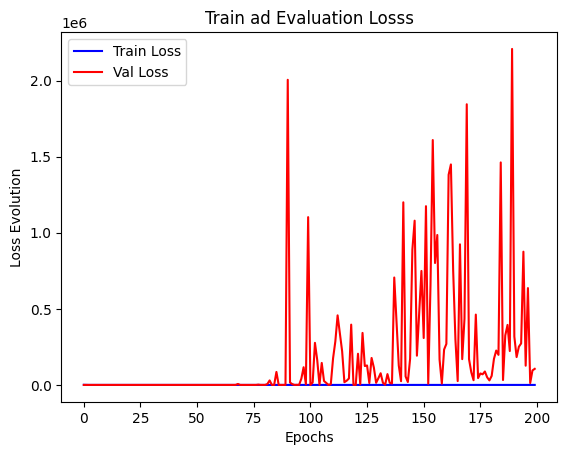

testing data:   0%|          | 0/21 [00:00<?, ?it/s]

MSE: tensor(40.3090, device='cuda:0')
RMSE: tensor(6.3489, device='cuda:0')
MAE: tensor(4.6722, device='cuda:0')
Spearman Corr: tensor(0.6805, device='cuda:0')


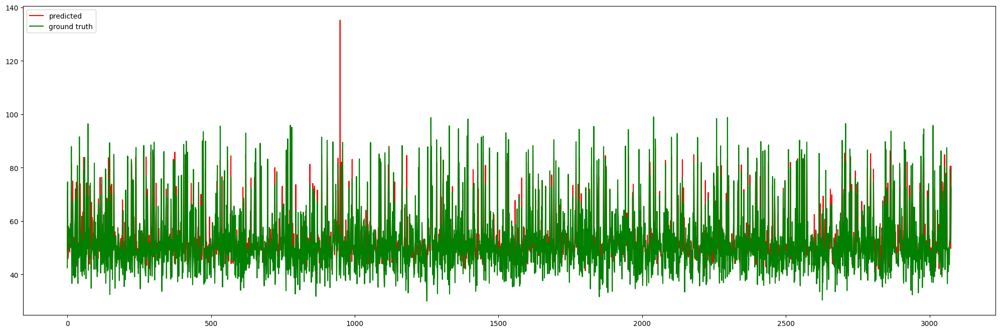

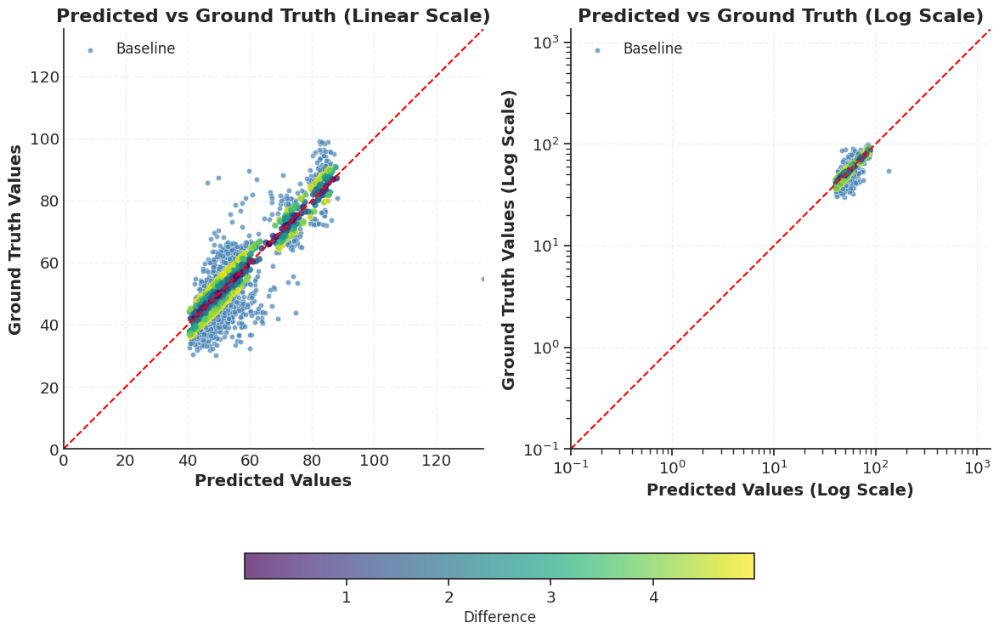

In [13]:

seq_struct_pred_W = LA_MLP_pred(embeddings_dim=1280, 
                                             output_dim=1, 
                                             dropout=0.25, 
                                             kernel_size=9, 
                                             conv_dropout= 0.25)
                                             #path_pretrained='../checkpoints/LA_MLP_TaskVectorBias_Merged_allnet_1_10_2023/')
# LightAttention(embeddings_dim=1280+128, output_dim=2, dropout=0.1, kernel_size=5, conv_dropout= 0.1)


optESM = torch.optim.AdamW(seq_struct_pred_W.parameters(), lr=1e-3)
lossESM= torch.nn.MSELoss()
epochs = 200

generating_results_approaches(seq_struct_pred_W, Trainer3, train_embedding_esm2, val_embedding_esm2, 
                              test_embedding_esm2, lossESM, optESM, epochs, device,
                              path_progres=path_progresESM, 
                              checkpoint_path=checkpoint_pathESM,
                              output_metrics=config['initial_paths']['output_metrics_ESM_only'])



### For Inverse Folding PiFold Using Prediction by Component (convolutions as a way of pooling + sum pooling to get the final predictions)

Directory '../checkpoints/PiFold_only/Global/AllMeltome_JustMSE/' created


  0%|          | 0/200 [00:00<?, ?it/s]

training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 1 loss: 703.883 val loss: 94.479


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 2 loss: 94.506 val loss: 86.420


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 3 loss: 87.603 val loss: 87.272


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 4 loss: 81.110 val loss: 85.874


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 5 loss: 77.380 val loss: 86.421


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 6 loss: 81.300 val loss: 85.539


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 7 loss: 71.673 val loss: 91.713


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 8 loss: 67.505 val loss: 73.347


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 9 loss: 61.332 val loss: 72.479


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 10 loss: 58.237 val loss: 71.623


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 11 loss: 56.046 val loss: 74.574


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 12 loss: 53.299 val loss: 71.197


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 13 loss: 50.651 val loss: 68.478


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 14 loss: 54.386 val loss: 70.106


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 15 loss: 54.692 val loss: 85.150


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 16 loss: 53.118 val loss: 75.015


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 17 loss: 50.167 val loss: 72.616


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 18 loss: 49.821 val loss: 73.239


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 19 loss: 48.220 val loss: 72.612


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 20 loss: 46.840 val loss: 69.863


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 21 loss: 46.407 val loss: 70.824


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 22 loss: 45.781 val loss: 69.961


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 23 loss: 44.931 val loss: 73.991


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 24 loss: 45.406 val loss: 72.849


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 25 loss: 42.592 val loss: 69.368


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 26 loss: 40.889 val loss: 117.271


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 27 loss: 41.223 val loss: 93.133


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 28 loss: 39.638 val loss: 86.072


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 29 loss: 39.386 val loss: 114.624


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 30 loss: 37.902 val loss: 92.810


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 31 loss: 38.523 val loss: 104.639


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 32 loss: 37.095 val loss: 128.356


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 33 loss: 36.769 val loss: 351.052


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 34 loss: 36.166 val loss: 85.367


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 35 loss: 35.552 val loss: 70.188


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 36 loss: 36.757 val loss: 75.494


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 37 loss: 34.144 val loss: 90.235


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 38 loss: 33.595 val loss: 98.123


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 39 loss: 33.231 val loss: 90.099


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 40 loss: 32.639 val loss: 85.501


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 41 loss: 32.490 val loss: 91.838


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 42 loss: 32.771 val loss: 91.333


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 43 loss: 31.113 val loss: 98.855


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 44 loss: 31.086 val loss: 102.919


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 45 loss: 31.018 val loss: 97.792


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 46 loss: 30.651 val loss: 87.735


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 47 loss: 28.687 val loss: 100.962


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 48 loss: 30.326 val loss: 112.631


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 49 loss: 29.390 val loss: 98.454


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 50 loss: 29.053 val loss: 79.153


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 51 loss: 28.885 val loss: 102.351


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 52 loss: 29.651 val loss: 112.915


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 53 loss: 28.459 val loss: 111.943


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 54 loss: 27.171 val loss: 104.796


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 55 loss: 28.826 val loss: 117.773


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 56 loss: 28.840 val loss: 94.440


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 57 loss: 27.051 val loss: 86.298


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 58 loss: 26.878 val loss: 102.447


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 59 loss: 27.289 val loss: 115.432


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 60 loss: 26.733 val loss: 114.822


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 61 loss: 27.534 val loss: 82.667


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 62 loss: 26.456 val loss: 118.214


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 63 loss: 27.322 val loss: 105.130


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 64 loss: 27.696 val loss: 100.607


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 65 loss: 25.353 val loss: 72.650


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 66 loss: 27.163 val loss: 106.175


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 67 loss: 26.523 val loss: 103.344


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 68 loss: 26.449 val loss: 112.209


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 69 loss: 26.178 val loss: 75.759


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 70 loss: 26.140 val loss: 102.506


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 71 loss: 25.820 val loss: 89.013


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 72 loss: 25.172 val loss: 88.261


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 73 loss: 25.916 val loss: 104.927


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 74 loss: 25.881 val loss: 98.073


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 75 loss: 25.726 val loss: 86.507


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 76 loss: 24.824 val loss: 95.156


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 77 loss: 24.869 val loss: 92.728


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 78 loss: 26.108 val loss: 126.998


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 79 loss: 24.762 val loss: 80.364


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 80 loss: 24.494 val loss: 90.517


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 81 loss: 25.106 val loss: 81.038


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 82 loss: 24.544 val loss: 90.110


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 83 loss: 23.387 val loss: 82.686


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 84 loss: 25.194 val loss: 104.288


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 85 loss: 23.961 val loss: 103.182


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 86 loss: 24.065 val loss: 89.566


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 87 loss: 22.947 val loss: 89.213


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 88 loss: 22.168 val loss: 107.512


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 89 loss: 20.451 val loss: 81.475


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 90 loss: 21.272 val loss: 106.583


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 91 loss: 20.461 val loss: 121.299


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 92 loss: 20.030 val loss: 103.453


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 93 loss: 18.572 val loss: 136.816


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 94 loss: 19.203 val loss: 224.390


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 95 loss: 19.822 val loss: 163.633


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 96 loss: 18.588 val loss: 137.542


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 97 loss: 18.960 val loss: 300.224


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 98 loss: 18.649 val loss: 211.963


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 99 loss: 18.031 val loss: 114.581


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 100 loss: 17.235 val loss: 127.754


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 101 loss: 17.367 val loss: 259.759


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 102 loss: 17.938 val loss: 215.559


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 103 loss: 18.402 val loss: 150.994


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 104 loss: 17.797 val loss: 133.648


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 105 loss: 17.289 val loss: 99.385


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 106 loss: 17.424 val loss: 243.143


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 107 loss: 17.226 val loss: 159.236


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 108 loss: 17.075 val loss: 135.700


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 109 loss: 16.409 val loss: 164.242


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 110 loss: 17.024 val loss: 327.482


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 111 loss: 17.438 val loss: 176.765


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 112 loss: 16.860 val loss: 213.422


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 113 loss: 17.232 val loss: 266.751


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 114 loss: 17.254 val loss: 1637.095


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 115 loss: 16.920 val loss: 767.777


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 116 loss: 16.611 val loss: 453.485


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 117 loss: 15.280 val loss: 917.261


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 118 loss: 16.510 val loss: 141.327


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 119 loss: 16.598 val loss: 189.234


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 120 loss: 17.695 val loss: 151.543


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 121 loss: 18.105 val loss: 314.655


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 122 loss: 15.713 val loss: 595.210


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 123 loss: 15.735 val loss: 148.715


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 124 loss: 16.585 val loss: 363.004


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 125 loss: 16.328 val loss: 178.183


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 126 loss: 16.608 val loss: 2601.291


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 127 loss: 16.755 val loss: 921.341


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 128 loss: 15.035 val loss: 1859.916


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 129 loss: 15.872 val loss: 1413.553


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 130 loss: 15.965 val loss: 1068.357


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 131 loss: 16.364 val loss: 1225.814


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 132 loss: 18.774 val loss: 125.752


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 133 loss: 22.020 val loss: 148.844


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 134 loss: 18.274 val loss: 144.717


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 135 loss: 18.660 val loss: 140.033


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 136 loss: 16.483 val loss: 138.336


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 137 loss: 16.275 val loss: 128.210


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 138 loss: 16.014 val loss: 141.123


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 139 loss: 16.356 val loss: 165.550


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 140 loss: 16.423 val loss: 123.961


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 141 loss: 15.751 val loss: 120.887


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 142 loss: 15.623 val loss: 201.185


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 143 loss: 14.781 val loss: 146.404


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 144 loss: 15.068 val loss: 105.318


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 145 loss: 16.395 val loss: 138.001


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 146 loss: 14.937 val loss: 131.959


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 147 loss: 15.132 val loss: 138.065


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 148 loss: 15.128 val loss: 128.955


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 149 loss: 15.592 val loss: 186.252


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 150 loss: 14.926 val loss: 126.047


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 151 loss: 14.313 val loss: 168.844


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 152 loss: 14.946 val loss: 160.845


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 153 loss: 14.241 val loss: 108.049


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 154 loss: 15.896 val loss: 172.158


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 155 loss: 15.122 val loss: 170.697


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 156 loss: 15.320 val loss: 150.827


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 157 loss: 14.402 val loss: 156.844


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 158 loss: 14.932 val loss: 149.960


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 159 loss: 15.067 val loss: 149.207


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 160 loss: 14.245 val loss: 172.098


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 161 loss: 14.283 val loss: 148.673


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 162 loss: 14.250 val loss: 108.148


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 163 loss: 15.675 val loss: 120.419


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 164 loss: 15.525 val loss: 137.856


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 165 loss: 14.588 val loss: 173.989


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 166 loss: 15.742 val loss: 158.987


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 167 loss: 15.231 val loss: 194.141


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 168 loss: 14.809 val loss: 146.584


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 169 loss: 14.250 val loss: 187.341


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 170 loss: 14.774 val loss: 157.915


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 171 loss: 14.804 val loss: 159.955


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 172 loss: 15.073 val loss: 162.155


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 173 loss: 14.195 val loss: 229.529


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 174 loss: 14.864 val loss: 176.786


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 175 loss: 14.531 val loss: 146.602


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 176 loss: 13.881 val loss: 118.837


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 177 loss: 15.392 val loss: 187.770


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 178 loss: 14.790 val loss: 132.118


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 179 loss: 13.934 val loss: 165.572


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 180 loss: 13.242 val loss: 189.564


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 181 loss: 14.609 val loss: 164.712


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 182 loss: 13.926 val loss: 136.686


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 183 loss: 14.186 val loss: 162.637


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 184 loss: 14.857 val loss: 197.570


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 185 loss: 15.237 val loss: 160.400


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 186 loss: 14.583 val loss: 134.544


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 187 loss: 13.903 val loss: 163.354


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 188 loss: 14.019 val loss: 189.008


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 189 loss: 14.163 val loss: 176.989


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 190 loss: 14.229 val loss: 238.458


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 191 loss: 14.605 val loss: 141.299


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 192 loss: 14.233 val loss: 154.132


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 193 loss: 14.635 val loss: 167.828


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 194 loss: 13.979 val loss: 199.258


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 195 loss: 14.725 val loss: 141.631


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 196 loss: 14.662 val loss: 162.312


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 197 loss: 14.616 val loss: 173.979


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 198 loss: 13.361 val loss: 211.438


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 199 loss: 14.049 val loss: 201.217


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 200 loss: 14.651 val loss: 168.893


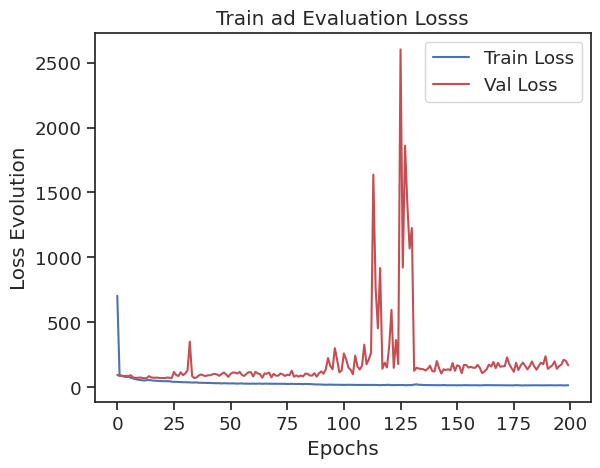

testing data:   0%|          | 0/21 [00:00<?, ?it/s]

MSE: tensor(87.4086, device='cuda:0')
RMSE: tensor(9.3493, device='cuda:0')
MAE: tensor(6.8587, device='cuda:0')
Spearman Corr: tensor(0.4053, device='cuda:0')


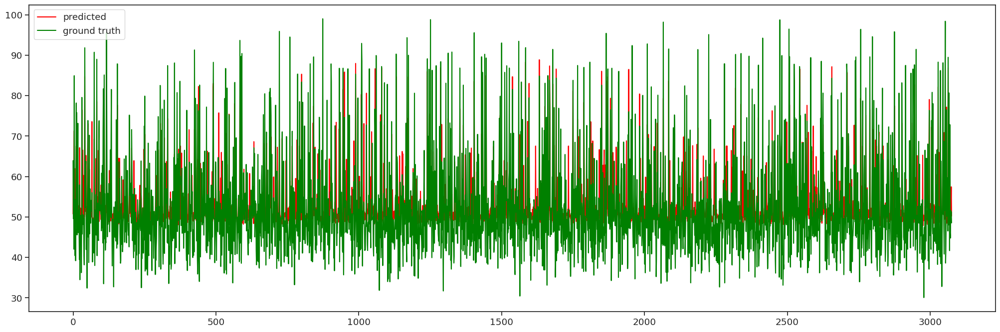

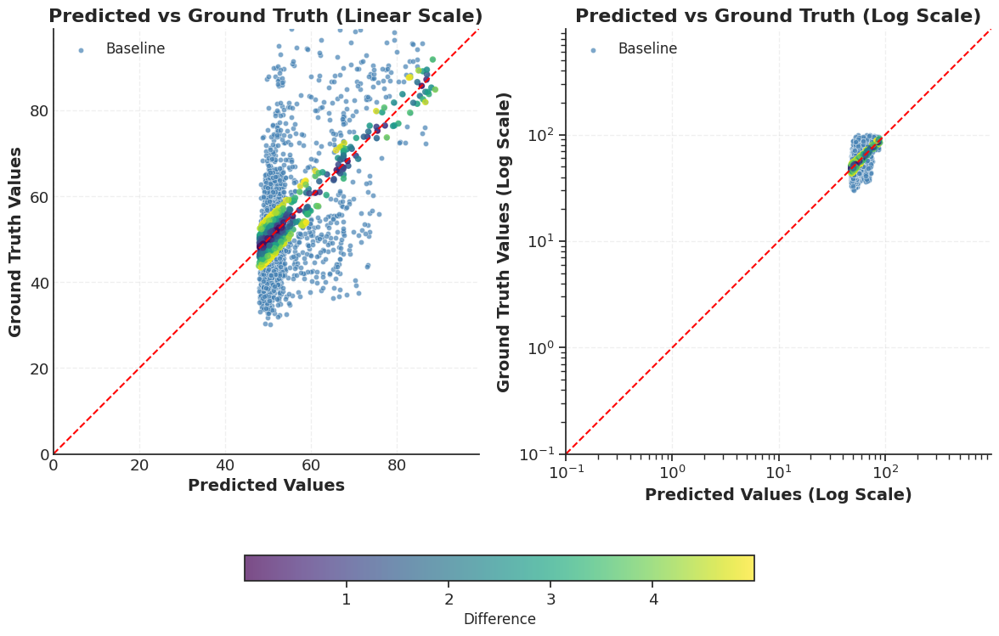

In [14]:

seq_struct_pred_W_PiFold = LA_MLP_pred(embeddings_dim=128, 
                                             output_dim=1, 
                                             dropout=0.25, 
                                             kernel_size=9, 
                                             conv_dropout= 0.25)
                                             #path_pretrained='../checkpoints/LA_MLP_TaskVectorBias_Merged_allnet_1_10_2023/')
# LightAttention(embeddings_dim=1280+128, output_dim=2, dropout=0.1, kernel_size=5, conv_dropout= 0.1)


optPiFold = torch.optim.AdamW(seq_struct_pred_W_PiFold.parameters(), lr=1e-3)
lossPiFold= torch.nn.MSELoss()
epochs = 200

generating_results_approaches(seq_struct_pred_W_PiFold, Trainer3, train_embedding_PiFold, val_embedding_PiFold, 
                              test_embedding_PiFold, lossPiFold, optPiFold, epochs, device,
                              path_progres=path_progresPiFold, 
                              checkpoint_path=checkpoint_pathPiFold,
                              output_metrics=config['initial_paths']['output_metrics_PiFold_only'])


### For Both ESM2 and Inverse Folding PiFold Contributions Together Using Prediction by Component (convolutions as a way of pooling + sum pooling to get the final predictions)

Directory '../checkpoints/Mix/Global/AllMeltome_JustMSE/' created


  0%|          | 0/200 [00:00<?, ?it/s]

training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 1 loss: 723.336 val loss: 63.368


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 2 loss: 57.120 val loss: 57.927


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 3 loss: 47.983 val loss: 42.360


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 4 loss: 36.103 val loss: 41.897


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 5 loss: 37.288 val loss: 38.187


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 6 loss: 33.532 val loss: 43.084


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 7 loss: 29.033 val loss: 195.209


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 8 loss: 25.758 val loss: 1164.187


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 9 loss: 22.591 val loss: 495.387


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 10 loss: 21.189 val loss: 73.633


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 11 loss: 19.849 val loss: 38.377


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 12 loss: 19.154 val loss: 35.842


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 13 loss: 18.035 val loss: 36.122


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 14 loss: 17.182 val loss: 36.148


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 15 loss: 16.237 val loss: 38.162


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 16 loss: 15.485 val loss: 37.984


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 17 loss: 14.952 val loss: 38.237


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 18 loss: 14.976 val loss: 46.220


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 19 loss: 14.367 val loss: 37.747


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 20 loss: 14.998 val loss: 189.439


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 21 loss: 12.844 val loss: 41.805


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 22 loss: 12.984 val loss: 48.226


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 23 loss: 13.212 val loss: 38.317


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 24 loss: 12.358 val loss: 37.869


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 25 loss: 13.085 val loss: 37.649


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 26 loss: 11.873 val loss: 37.167


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 27 loss: 11.073 val loss: 36.613


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 28 loss: 11.295 val loss: 37.183


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 29 loss: 11.154 val loss: 40.395


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 30 loss: 10.296 val loss: 37.976


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 31 loss: 10.425 val loss: 35.498


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 32 loss: 10.007 val loss: 39.039


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 33 loss: 10.002 val loss: 39.540


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 34 loss: 10.286 val loss: 35.885


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 35 loss: 9.925 val loss: 36.872


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 36 loss: 9.787 val loss: 36.571


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 37 loss: 9.427 val loss: 35.815


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 38 loss: 9.042 val loss: 39.096


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 39 loss: 9.322 val loss: 36.721


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 40 loss: 8.861 val loss: 37.136


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 41 loss: 8.788 val loss: 39.204


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 42 loss: 8.666 val loss: 39.422


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 43 loss: 9.311 val loss: 40.677


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 44 loss: 9.808 val loss: 41.033


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 45 loss: 9.490 val loss: 37.350


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 46 loss: 9.040 val loss: 37.842


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 47 loss: 9.650 val loss: 35.735


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 48 loss: 8.434 val loss: 36.093


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 49 loss: 8.658 val loss: 35.310


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 50 loss: 8.086 val loss: 39.264


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 51 loss: 8.151 val loss: 40.110


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 52 loss: 8.326 val loss: 37.940


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 53 loss: 7.999 val loss: 37.845


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 54 loss: 7.966 val loss: 37.702


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 55 loss: 8.470 val loss: 36.113


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 56 loss: 8.412 val loss: 36.863


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 57 loss: 8.464 val loss: 35.901


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 58 loss: 7.622 val loss: 38.132


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 59 loss: 8.414 val loss: 40.166


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 60 loss: 7.787 val loss: 40.901


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 61 loss: 7.742 val loss: 41.001


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 62 loss: 8.683 val loss: 41.718


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 63 loss: 7.834 val loss: 37.566


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 64 loss: 7.665 val loss: 37.025


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 65 loss: 7.610 val loss: 37.788


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 66 loss: 7.396 val loss: 35.952


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 67 loss: 8.097 val loss: 47.333


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 68 loss: 7.576 val loss: 45.785


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 69 loss: 8.059 val loss: 46.340


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 70 loss: 7.857 val loss: 37.313


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 71 loss: 7.288 val loss: 39.826


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 72 loss: 7.357 val loss: 39.436


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 73 loss: 7.497 val loss: 41.133


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 74 loss: 7.815 val loss: 40.719


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 75 loss: 7.561 val loss: 40.687


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 76 loss: 7.076 val loss: 43.177


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 77 loss: 7.558 val loss: 42.323


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 78 loss: 7.313 val loss: 41.092


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 79 loss: 6.942 val loss: 39.640


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 80 loss: 7.134 val loss: 39.137


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 81 loss: 6.901 val loss: 36.919


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 82 loss: 7.461 val loss: 43.381


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 83 loss: 7.327 val loss: 39.463


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 84 loss: 7.205 val loss: 39.999


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 85 loss: 6.776 val loss: 39.041


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 86 loss: 6.845 val loss: 40.015


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 87 loss: 6.957 val loss: 38.219


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 88 loss: 7.120 val loss: 43.770


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 89 loss: 7.164 val loss: 39.342


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 90 loss: 6.709 val loss: 41.343


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 91 loss: 7.108 val loss: 39.015


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 92 loss: 7.141 val loss: 48.131


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 93 loss: 6.528 val loss: 41.654


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 94 loss: 6.915 val loss: 39.019


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 95 loss: 6.613 val loss: 42.426


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 96 loss: 7.201 val loss: 42.295


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 97 loss: 7.067 val loss: 38.482


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 98 loss: 6.427 val loss: 44.402


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 99 loss: 6.618 val loss: 42.585


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 100 loss: 6.456 val loss: 40.419


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 101 loss: 6.824 val loss: 40.034


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 102 loss: 6.555 val loss: 42.618


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 103 loss: 7.133 val loss: 43.141


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 104 loss: 6.632 val loss: 38.155


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 105 loss: 6.315 val loss: 37.043


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 106 loss: 6.645 val loss: 38.084


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 107 loss: 6.502 val loss: 36.730


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 108 loss: 6.460 val loss: 39.189


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 109 loss: 6.552 val loss: 38.724


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 110 loss: 6.493 val loss: 42.880


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 111 loss: 6.553 val loss: 38.196


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 112 loss: 5.922 val loss: 40.843


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 113 loss: 6.328 val loss: 39.997


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 114 loss: 6.522 val loss: 40.520


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 115 loss: 6.308 val loss: 42.760


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 116 loss: 6.532 val loss: 43.356


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 117 loss: 6.420 val loss: 38.632


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 118 loss: 6.471 val loss: 38.657


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 119 loss: 6.228 val loss: 38.067


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 120 loss: 6.283 val loss: 154.763


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 121 loss: 6.235 val loss: 40.085


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 122 loss: 6.104 val loss: 38.007


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 123 loss: 6.000 val loss: 38.798


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 124 loss: 6.112 val loss: 35.559


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 125 loss: 6.048 val loss: 40.316


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 126 loss: 6.410 val loss: 40.477


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 127 loss: 6.012 val loss: 39.854


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 128 loss: 6.395 val loss: 38.244


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 129 loss: 5.705 val loss: 41.004


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 130 loss: 5.711 val loss: 42.372


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 131 loss: 5.794 val loss: 43.938


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 132 loss: 6.040 val loss: 37.232


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 133 loss: 6.352 val loss: 36.324


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 134 loss: 6.332 val loss: 36.917


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 135 loss: 6.026 val loss: 40.300


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 136 loss: 5.908 val loss: 37.418


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 137 loss: 5.679 val loss: 36.850


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 138 loss: 5.904 val loss: 40.871


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 139 loss: 6.084 val loss: 40.066


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 140 loss: 5.670 val loss: 41.080


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 141 loss: 6.147 val loss: 38.114


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 142 loss: 5.935 val loss: 43.736


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 143 loss: 6.311 val loss: 69.900


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 144 loss: 5.804 val loss: 41.154


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 145 loss: 6.093 val loss: 42.221


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 146 loss: 5.764 val loss: 41.025


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 147 loss: 5.554 val loss: 43.687


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 148 loss: 5.519 val loss: 38.651


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 149 loss: 5.554 val loss: 40.893


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 150 loss: 5.762 val loss: 46.663


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 151 loss: 6.049 val loss: 48.100


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 152 loss: 5.949 val loss: 41.672


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 153 loss: 5.572 val loss: 42.342


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 154 loss: 5.813 val loss: 43.874


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 155 loss: 5.706 val loss: 39.728


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 156 loss: 5.355 val loss: 38.228


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 157 loss: 5.790 val loss: 36.937


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 158 loss: 5.457 val loss: 41.452


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 159 loss: 5.383 val loss: 1787.797


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 160 loss: 5.875 val loss: 42.205


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 161 loss: 5.249 val loss: 42.649


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 162 loss: 5.560 val loss: 42.761


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 163 loss: 5.525 val loss: 44.238


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 164 loss: 5.263 val loss: 45.964


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 165 loss: 5.407 val loss: 3705.251


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 166 loss: 5.266 val loss: 38.521


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 167 loss: 5.349 val loss: 40.938


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 168 loss: 5.521 val loss: 41.636


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 169 loss: 5.535 val loss: 5129.153


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 170 loss: 6.062 val loss: 6208.890


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 171 loss: 5.612 val loss: 37.199


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 172 loss: 5.527 val loss: 40.893


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 173 loss: 5.469 val loss: 41.425


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 174 loss: 5.639 val loss: 42.217


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 175 loss: 5.538 val loss: 12725.638


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 176 loss: 5.560 val loss: 45.556


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 177 loss: 5.780 val loss: 43.367


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 178 loss: 5.485 val loss: 14071.108


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 179 loss: 5.347 val loss: 42.568


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 180 loss: 5.592 val loss: 45.172


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 181 loss: 5.437 val loss: 39.994


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 182 loss: 5.680 val loss: 60.541


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 183 loss: 5.364 val loss: 44.721


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 184 loss: 5.181 val loss: 43.752


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 185 loss: 5.518 val loss: 37.666


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 186 loss: 5.417 val loss: 40729.117


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 187 loss: 5.255 val loss: 35016.441


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 188 loss: 5.374 val loss: 42.851


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 189 loss: 5.311 val loss: 41.885


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 190 loss: 5.166 val loss: 39.030


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 191 loss: 5.688 val loss: 40.423


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 192 loss: 5.539 val loss: 42.201


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 193 loss: 4.993 val loss: 90582.708


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 194 loss: 5.250 val loss: 46.524


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 195 loss: 5.345 val loss: 38225.814


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 196 loss: 5.650 val loss: 17628.199


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 197 loss: 5.088 val loss: 38.863


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 198 loss: 5.395 val loss: 45.101


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 199 loss: 5.280 val loss: 45.559


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 200 loss: 5.147 val loss: 46.027


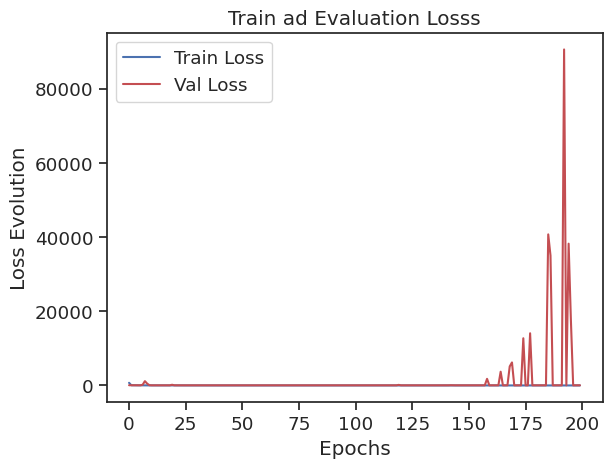

testing data:   0%|          | 0/21 [00:00<?, ?it/s]

MSE: tensor(37.3144, device='cuda:0')
RMSE: tensor(6.1085, device='cuda:0')
MAE: tensor(4.5797, device='cuda:0')
Spearman Corr: tensor(0.6849, device='cuda:0')


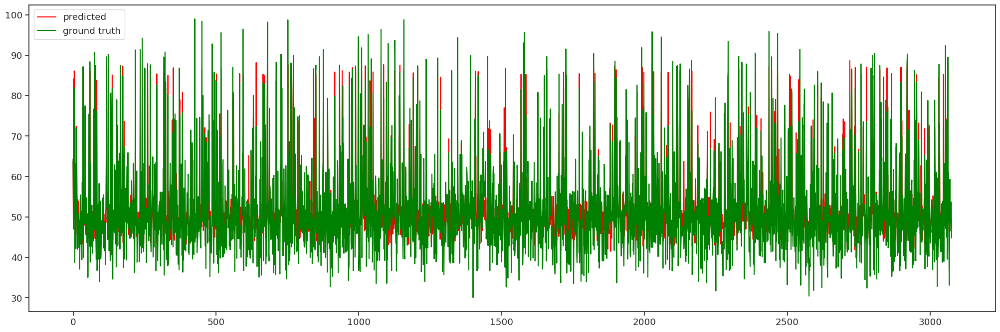

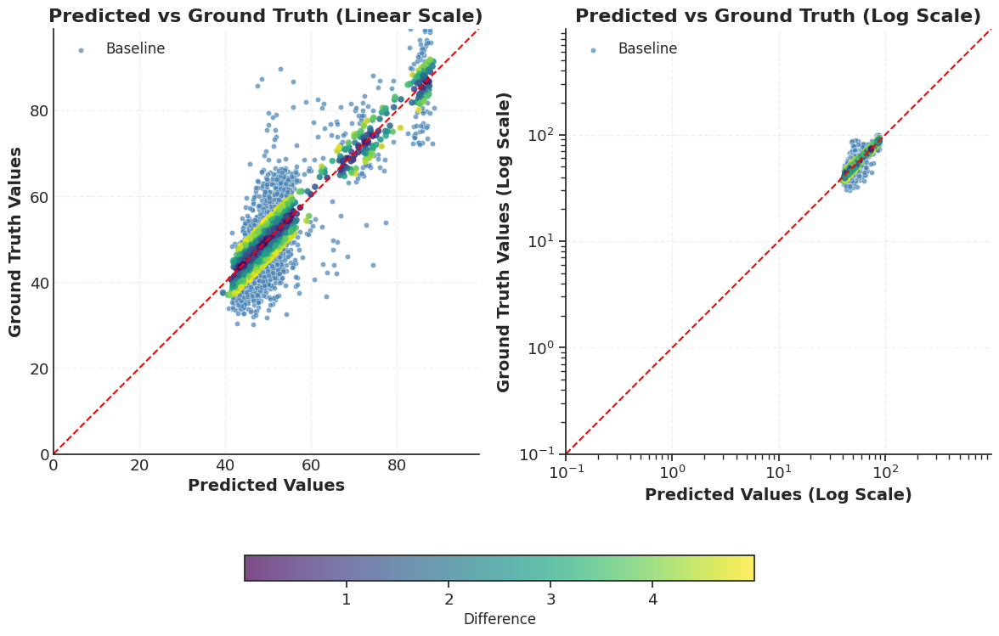

In [15]:

import torchsort, sys
sys.path.append(os.path.abspath("../ref_models/fast_soft_sort"))
from ref_models.fast_soft_sort.fast_soft_sort.pytorch_ops import soft_rank, soft_sort

#import ipdb; ipdb.set_trace()
seq_struct_pred_W_merged = LA_MLP_pred(embeddings_dim=1280+128, 
                                             output_dim=1, 
                                             dropout=0.25, 
                                             kernel_size=9, 
                                             conv_dropout= 0.25)
                                             #path_pretrained='../checkpoints/LA_MLP_TaskVectorBias_Merged_allnet_1_10_2023/')
# LightAttention(embeddings_dim=1280+128, output_dim=2, dropout=0.1, kernel_size=5, conv_dropout= 0.1)


optIFM = torch.optim.AdamW(seq_struct_pred_W_merged.parameters(), lr=1e-3)
lossIFM= torch.nn.MSELoss()
epochs = 200

generating_results_approaches(seq_struct_pred_W_merged, Trainer3, train_embedding_merged, val_embedding_merged, 
                              test_embedding_merged, lossIFM, optIFM, epochs, device,
                              path_progres=path_progresMix, 
                              checkpoint_path=checkpoint_pathMix,
                              output_metrics=config['initial_paths']['output_metrics_Both'])
